In [1]:
from skimage.io import imread, imshow
from skimage import img_as_float, img_as_ubyte
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# Вспомогательные функции для удобного отображения
def disp(img: np.ndarray, figsize: tuple = (10, 10)):
    plt.figure(figsize = figsize)
    imshow(img)
    
def disp_mult(*imgs):
    cnt = len(imgs)
    for i in range(cnt):
        plt.figure(figsize = (10, 10))
        imshow(imgs[i])

### 1

(621, 684, 3)

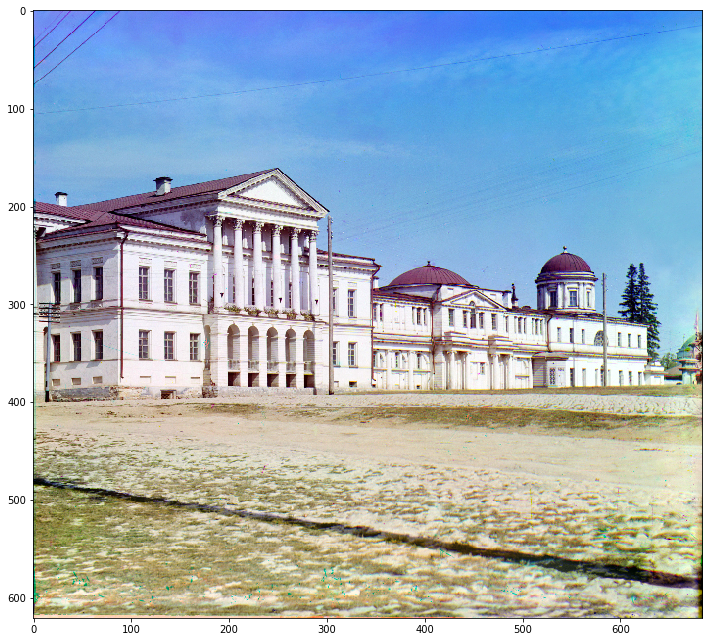

In [3]:
# Изображение большое и потребует много времени на обработку, поэтому считаем только каждый 5-й пиксель по каждой оси
orig = imread('img.jpg')[::5, ::5]
disp(orig)
orig.shape

### 2

In [4]:
def add_to_img(img: np.ndarray, size: tuple = (1, 1)) -> np.ndarray:
    """
    Возвращает новое изображение с добавленными пикселями по краям
    img - изображение
    size - tuple с двумя значениями: size[0] - кол-во пикселей, которое нужно добавить по высоте, size[1] - по ширине
    """
    wide = add_width_to_img(img, size[1]) if size[1] > 0 else img.copy()
    tall = add_height_to_img(wide, size[0]) if size[0] > 0 else wide
    return tall

def add_width_to_img(img: np.ndarray, w: int) -> np.ndarray:
    """
    Возвращает новое изображение с добавленными пикселями по краям по ширине
    img - изображение
    w - количество пикселей, которое нужно добавить с каждой стороны
    """
    new_w = img.shape[1] + w * 2
    shape = (img.shape[0], new_w, img.shape[2]) if is_colorful(img) else (img.shape[0], new_w)
    res = np.zeros(shape, dtype = img.dtype)
    res[:,w : -w] = img
    
    for i in range(w - 1, -1, -1):
        for j in range(res.shape[0]):
            k = res.shape[1] - i - 1
            
            t = max(0, j - 1)
            b = min(res.shape[0], j + 1)
                
            res[j, i] = np.mean(res[t : b + 1, i + 1], axis = 0, dtype = 'uint')
            res[j, k] = np.mean(res[t : b + 1, k - 1], axis = 0, dtype = 'uint')
    return res

def add_height_to_img(img: np.ndarray, h: int) -> np.ndarray:
    """
    Возвращает новое изображение с добавленными пикселями по краям по высоте
    img - изображение
    h - количество пикселей, которое нужно добавить с каждой стороны
    """
    new_h = img.shape[0] + h * 2
    shape = (new_h, img.shape[1], img.shape[2]) if is_colorful(img) else (new_h, img.shape[1])
    res = np.zeros(shape, dtype = img.dtype)
    res[h : -h,:] = img
    
    for i in range(h - 1, -1, -1):
        for j in range(res.shape[1]):
            k = res.shape[0] - i - 1
            
            l = max(0, j - 1)
            r = min(res.shape[1], j + 1)
                
            res[i, j] = np.mean(res[i + 1, l : r + 1], axis = 0, dtype = 'uint')
            res[k, j] = np.mean(res[k - 1, l : r + 1], axis = 0, dtype = 'uint')
    return res

def is_colorful(img: np.ndarray) -> bool:
    return len(img.shape) == 3 and img.shape[2] == 3

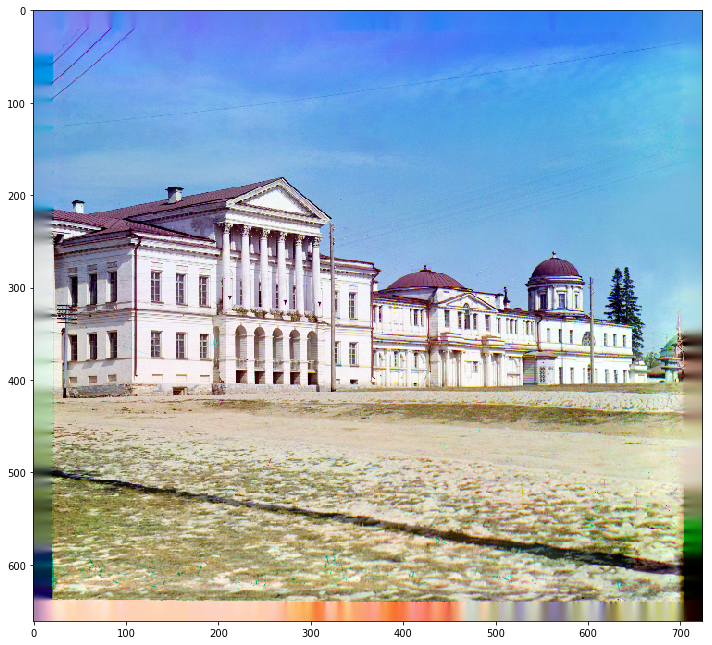

In [5]:
disp(add_to_img(orig, (20, 20)))

### 3

In [6]:
def box_filter(img: np.ndarray, size: tuple) -> np.ndarray:
    """
    Возвращает новое изображение, размытое box-фильтрацией
    img - изображение
    size - размеры окна размытия, высота х ширина
    """
    res = np.zeros(img.shape, img.dtype)
    a, b = size[0] // 2, size[1] // 2
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            u = max(0, i - a)
            d = min(img.shape[0] - 1, i + a)
            l = max(0, j - b)
            r = min(img.shape[1] - 1, j + b)
            res[i, j] = np.mean(img[u : d + 1, l : r + 1], (0, 1)).astype(img.dtype)
    return res

In [7]:
box3 = box_filter(orig, (3, 3))
box5 = box_filter(orig, (5, 5))
box7 = box_filter(orig, (7, 7))

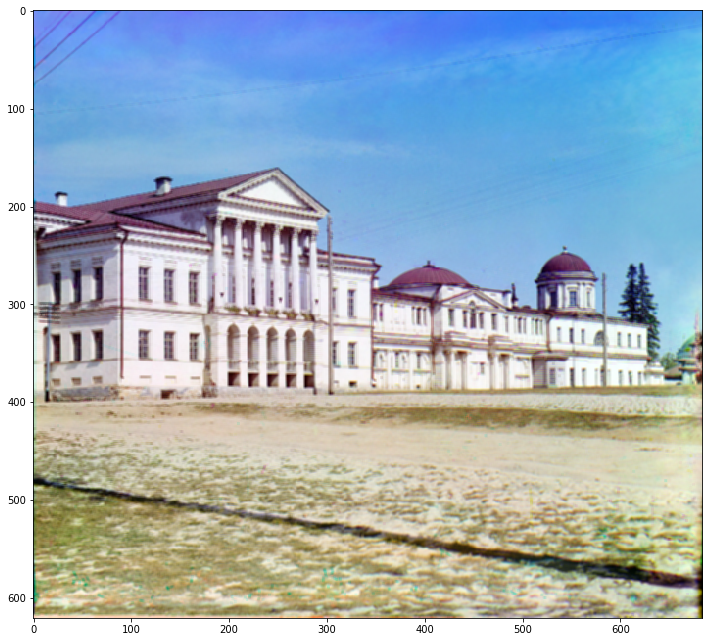

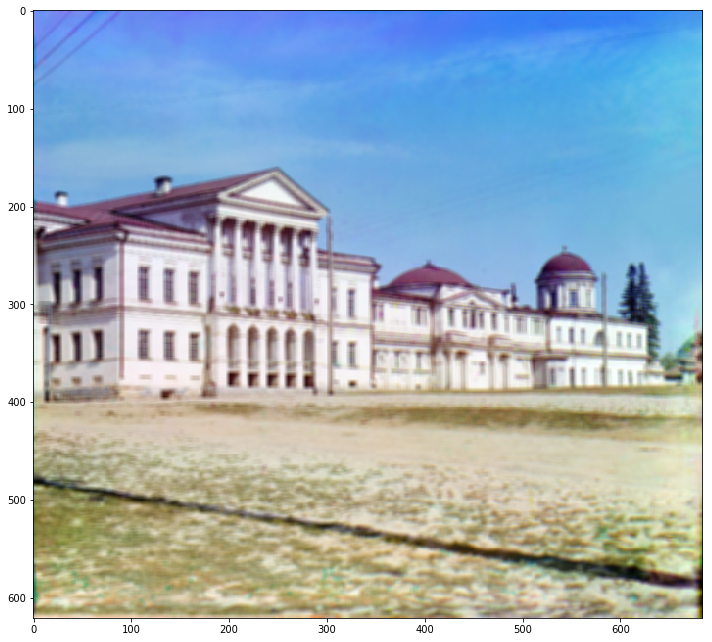

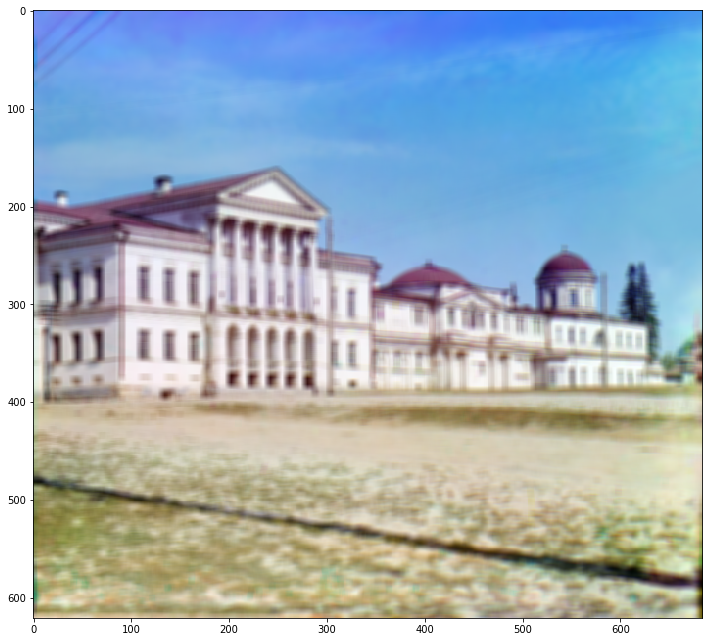

In [8]:
disp_mult(box3, box5, box7)

### 4

In [9]:
def median_filter(img: np.ndarray, size: tuple) -> np.ndarray:
    """
    Возвращает новое изображение, размытое медианным фильтром
    img - изображение
    size - размеры окна размытия, высота х ширина
    """
    res = np.zeros(img.shape, img.dtype)
    a, b = size[0] // 2, size[1] // 2
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            u = max(0, i - a)
            d = min(img.shape[0] - 1, i + a)
            l = max(0, j - b)
            r = min(img.shape[1] - 1, j + b)
            res[i, j] = np.median(img[u : d + 1, l : r + 1], (0, 1)).astype(img.dtype)
    return res

In [10]:
med3 = median_filter(orig, (3, 3))
med5 = median_filter(orig, (5, 5))
med7 = median_filter(orig, (7, 7))

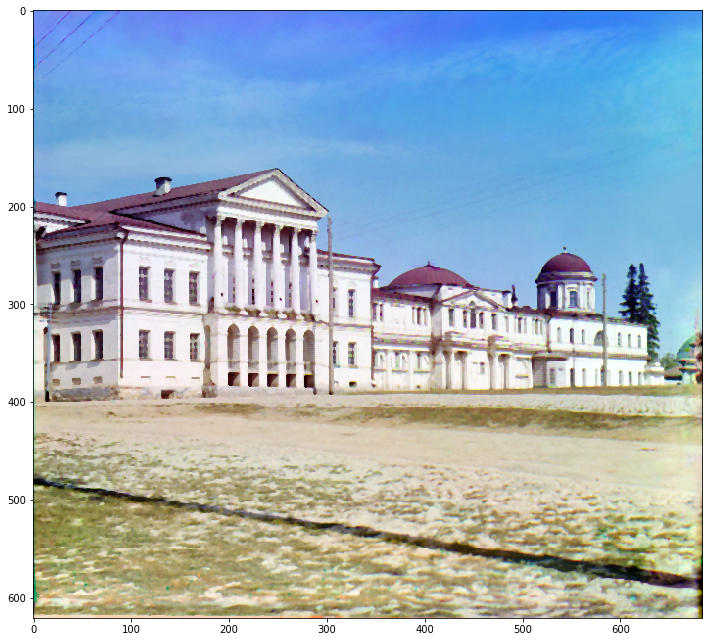

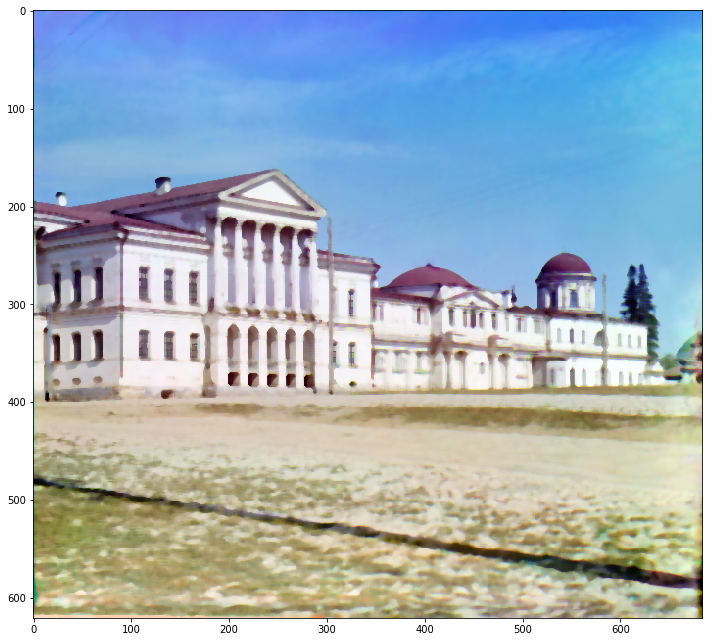

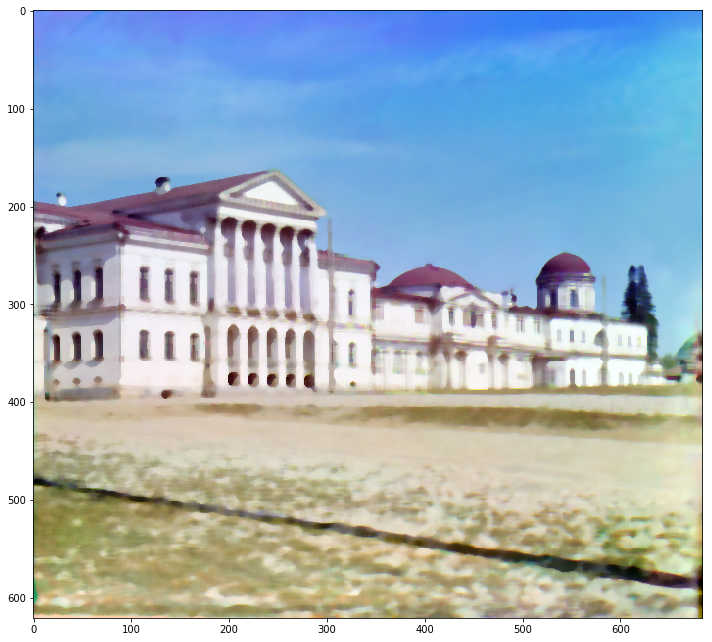

In [11]:
disp_mult(med3, med5, med7)

### 5-7

In [12]:
def filter_with_matrix(img: np.ndarray, mtx: np.ndarray, coeff = 1) -> np.ndarray:
    """
    Возвращает новое изображение, отфильтрованное матрицей
    Каждый пиксель нового изображения равен сумме произведений элементов матрицы на соответствующие им пиксели,
    умноженной на коэффициент
    img - изображение
    mtx - матрица
    coeff - коэффициент, на который надо домножить каждую сумму
    """
    off = mtx.shape[0] // 2
    # дополняем изображение по краям, чтобы провести фильтрацию по всему изображению
    res = add_to_img(img, (off, off))
    # разные функции для монохромных и цветных изображений
    if is_colorful(res):
        res = filter_colorful(res, mtx, off, coeff)
    else:
        res = filter_gray(res, mtx, off, coeff)
    # возвращаем результат без дополнения по краям
    return res[off: res.shape[0] - off, off: res.shape[1] - off]

def filter_colorful(img: np.ndarray, mtx: np.ndarray, off: int, coeff: int) -> np.ndarray:
    res = img.copy()
    for i in range(off, res.shape[0] - off):
        for j in range(off, res.shape[1] - off):
            for c in range(res.shape[2]):
                res[i, j, c] = coeff * np.sum(mtx * img[i - off : i + off + 1, j - off : j + off + 1, c])
    return res
                
def filter_gray(img: np.ndarray, mtx: np.ndarray, off: int, coeff: int) -> np.ndarray:
    res = img.copy()
    for i in range(off, res.shape[0] - off):
        for j in range(off, res.shape[1] - off):
            res[i, j] = coeff * np.sum(mtx * img[i - off : i + off + 1, j - off : j + off + 1])
    return res

#### 5

In [31]:
def get_gaussian_mtx(sigma: float, size = 1) -> np.ndarray:
    """
    Возвращает матрицу размытия по закону Гауссовского распределения заданного размера для заданного ср. кв. откл.
    sigma - среднеквадратичное отклонение матрицы
    size - размер квадратной матрицы
    """
    off = size // 2
    div = 2 * sigma ** 2
    mtx = np.zeros((size, size))
    for i in range(size):
        for j in range(size):
            # переводим координаты i, j в смещение относительно центрального элемента
            u, v = i - off, j - off
            mtx[i, j] = np.exp(-(u ** 2 + v ** 2) / div)
    return mtx

def gaussian_blur(img: np.ndarray, sigma: float, size = 1) -> np.ndarray:
    """
    Возвращает изображение, размытое по Гауссу
    img - изображение
    sigma - среднеквадратичное отклонение распределения
    size - размер матрицы распределения
    """
    div = 1 / (2 * np.pi * sigma ** 2)
    mtx = get_gaussian_mtx(sigma, size)
    return filter_with_matrix(img, mtx, div)

#### 6

In [32]:
gaussed5 = gaussian_blur(orig, 1, 5)
gaussed9 = gaussian_blur(orig, 1.5, 9)
gaussed13 = gaussian_blur(orig, 2, 13)

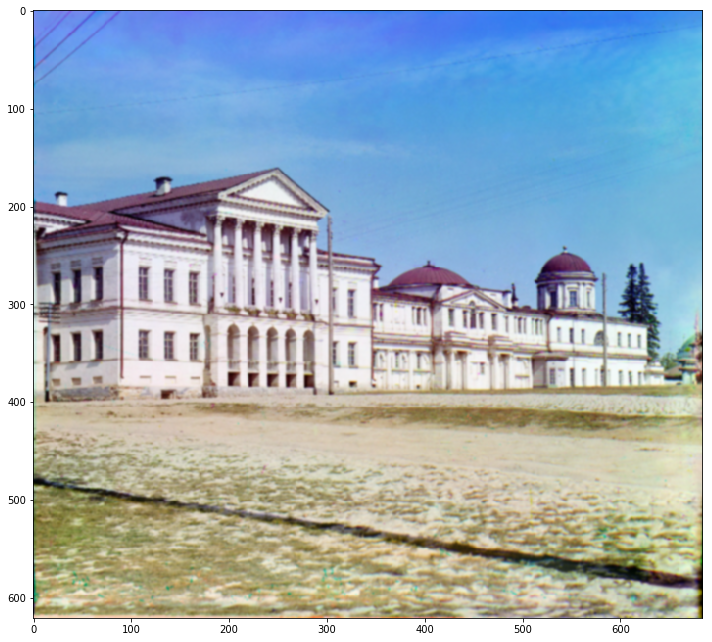

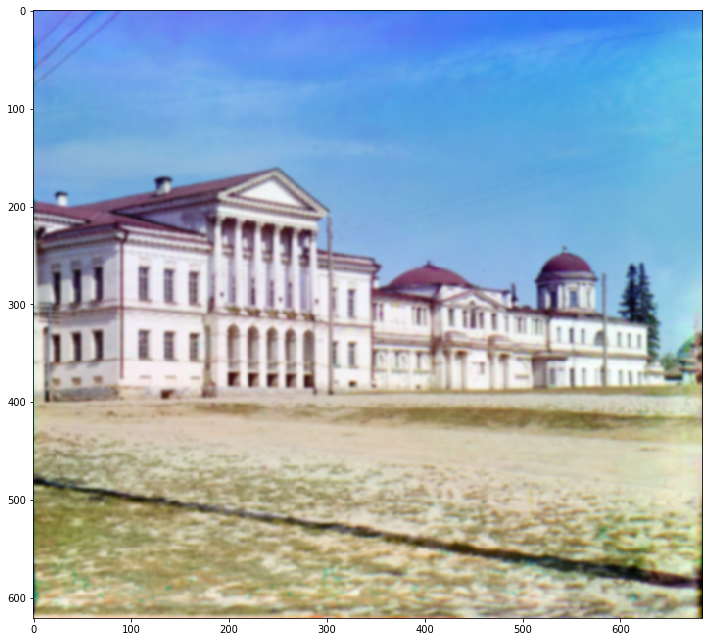

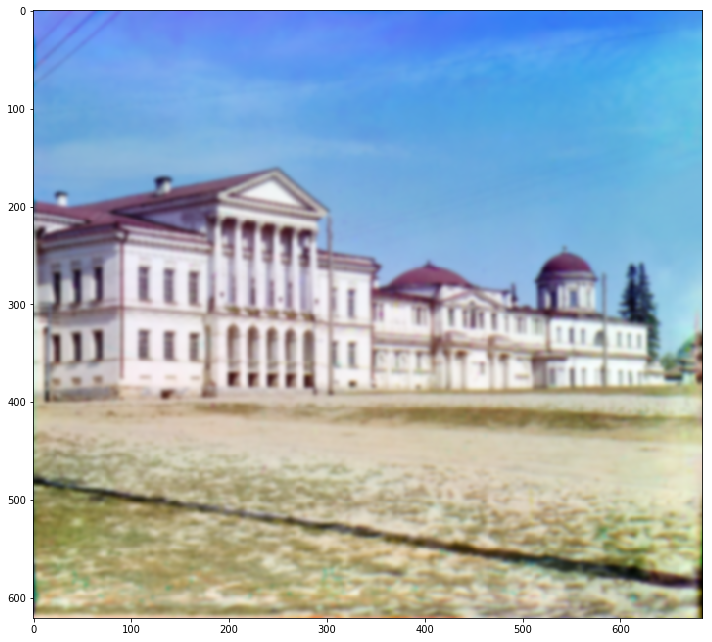

In [15]:
disp_mult(gaussed5, gaussed9, gaussed13)

#### 7

In [16]:
def apply_convolution_matrix(img: np.ndarray, mtx: np.ndarray) -> np.ndarray:
    """
    Возвращает изображение, отфильтрованное матрицей по алгоритму свертки
    Каждый пиксель изображения делится на коэффициент нормирования, равный сумме значений матрицы или 1, если сумма равна 0
    img - изображение
    mtx - матрица
    """
    div = np.sum(mtx)
    if div == 0:
        div = 1
    return filter_with_matrix(img, mtx, 1 / div)

In [17]:
# матрица из примера
mtx = np.array([
    [.5, .75, .5],
    [.75, 1, .75],
    [.5, .75, .5]
])

In [18]:
filtered = apply_convolution_matrix(orig, mtx)

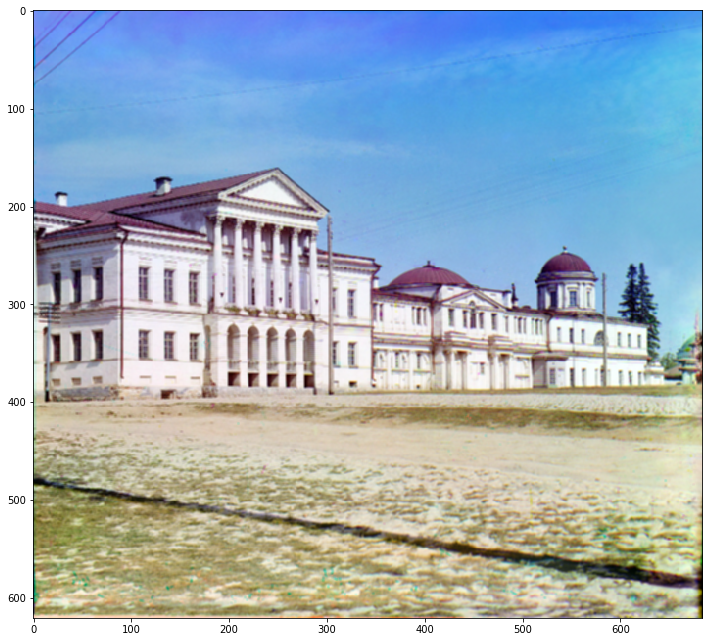

In [19]:
disp(filtered)

### 8

In [20]:
# матрицу Робертса было проще немного дополнить,
# т. к. функция filter_with_matrix умеет работать только с матрицами с нечетными измерениями
roberts_mtx = (
    np.array([
        [0,  0,  0],
        [0, -1,  0],
        [0,  0,  1]
    ]),
    np.array([
        [0,  0,  0],
        [0,  0, -1],
        [0,  1,  0]
    ])
)

# маски операторов Превитта и Собеля являются просто транспортами друг друга
previtt_mtx = np.array([
    [-1, -1, -1],
    [ 0,  0,  0],
    [ 1,  1,  1]
])
previtt_mtx = (
    previtt_mtx,
    previtt_mtx.T
)

sobel_mtx = np.array([
    [-1, -2, -1],
    [ 0,  0,  0],
    [ 1,  2,  1]
])
sobel_mtx = (
    sobel_mtx,
    sobel_mtx.T
)

In [21]:
grey_mult = np.array([.2989, .587, .114])

def rgb2grey(img: np.ndarray) -> np.ndarray:
    """Возвращает изображение, являющейся монохромной копией исходного цветного"""
    # Каждый пиксель монохромного изображения является
    # скалярным произведением вектора значений rgb исходного пикселя и вектора коэффициентов
    return (img[:,:] @ grey_mult).astype('uint8')

def edge_filter_with_mtxs(img: np.ndarray, mtxs: tuple) -> np.ndarray:
    """
    Возвращает изображение с выделенными границами
    img - изображение
    mtxs - матрицы-операторы
    """
    grey = img_as_float(rgb2grey(img)) if is_colorful(img) else img_as_float(img)
    
    a = apply_convolution_matrix(grey, mtxs[0])
    b = apply_convolution_matrix(grey, mtxs[1])
    
    res = np.sqrt(np.square(a) + np.square(b))
    res = np.clip(res, 0, 1)
    res = img_as_ubyte(res)
    gradient = np.arctan2(a, b)
    
    return res, gradient

In [22]:
roberts = edge_filter_with_mtxs(orig, roberts_mtx)

D:\Anaconda3\lib\site-packages\skimage\util\dtype.py:141: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


In [23]:
previtt = edge_filter_with_mtxs(orig, previtt_mtx)

In [24]:
sobel = edge_filter_with_mtxs(orig, sobel_mtx)

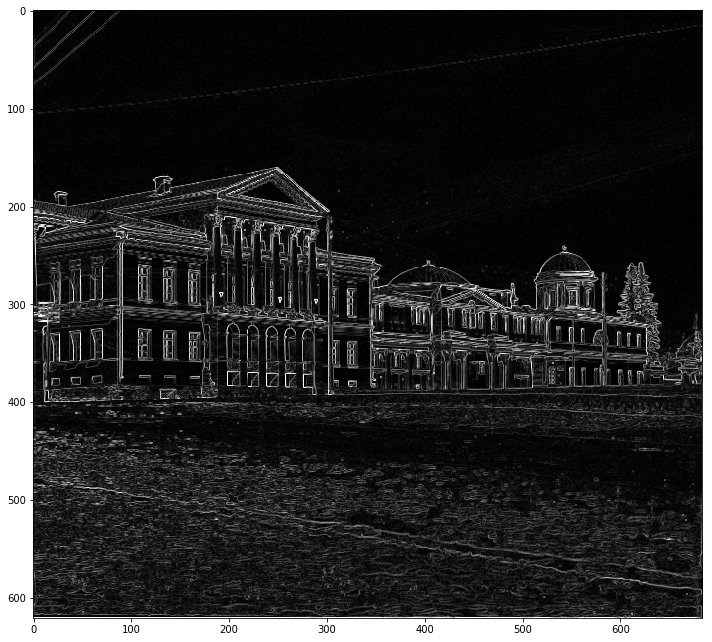

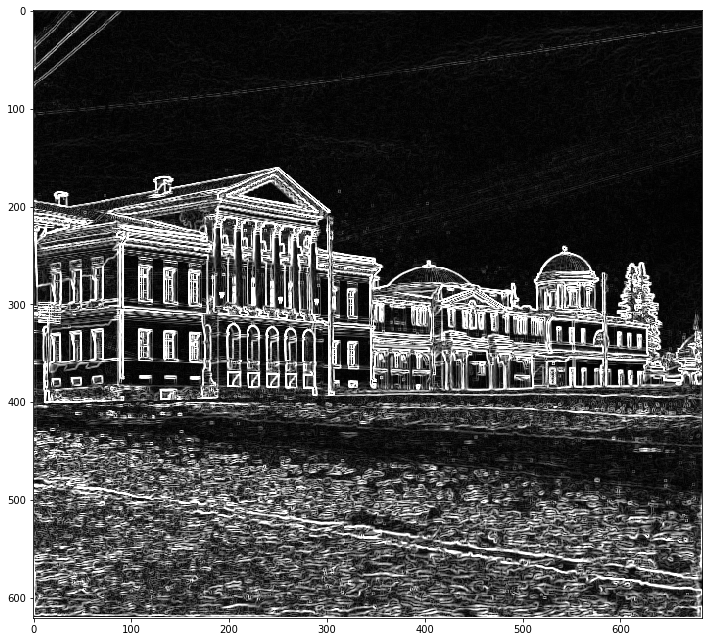

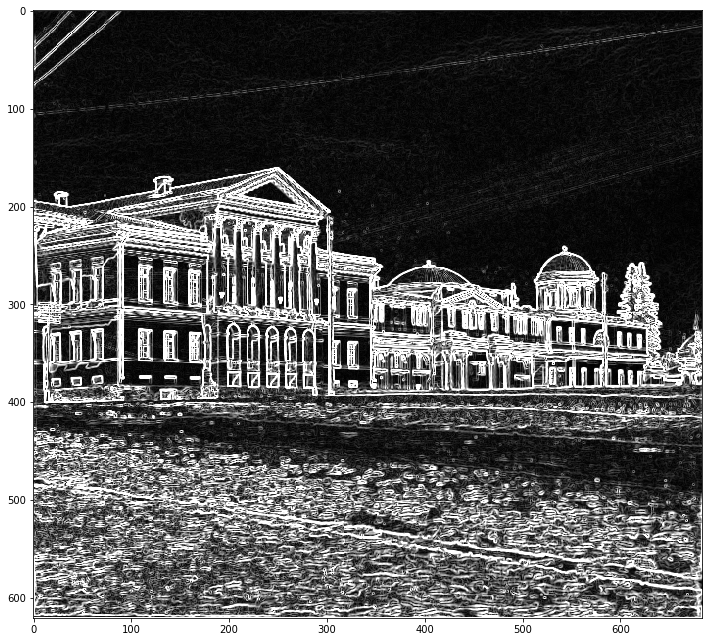

In [25]:
disp_mult(roberts[0], previtt[0], sobel[0])

In [26]:
orig2 = imread('img2.jpg')

In [27]:
roberts2 = edge_filter_with_mtxs(orig2, roberts_mtx)

In [28]:
previtt2 = edge_filter_with_mtxs(orig2, previtt_mtx)

In [29]:
sobel2 = edge_filter_with_mtxs(orig2, sobel_mtx)

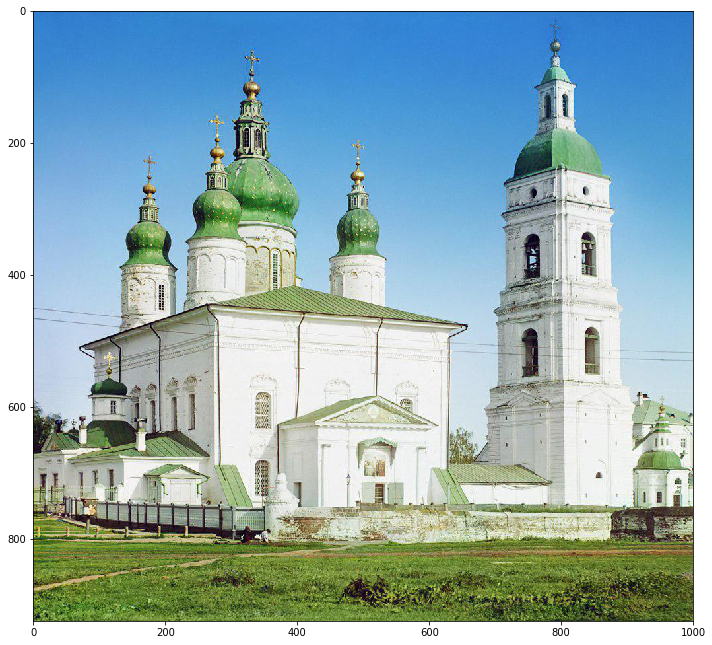

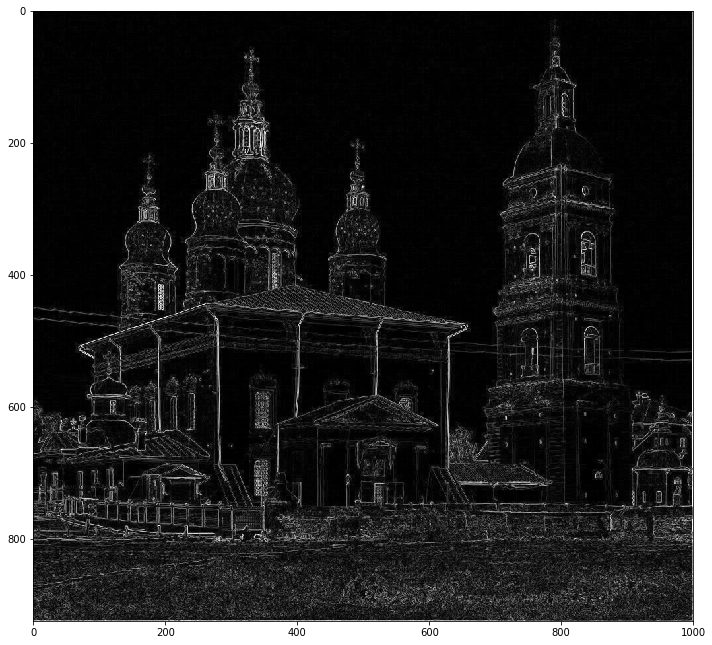

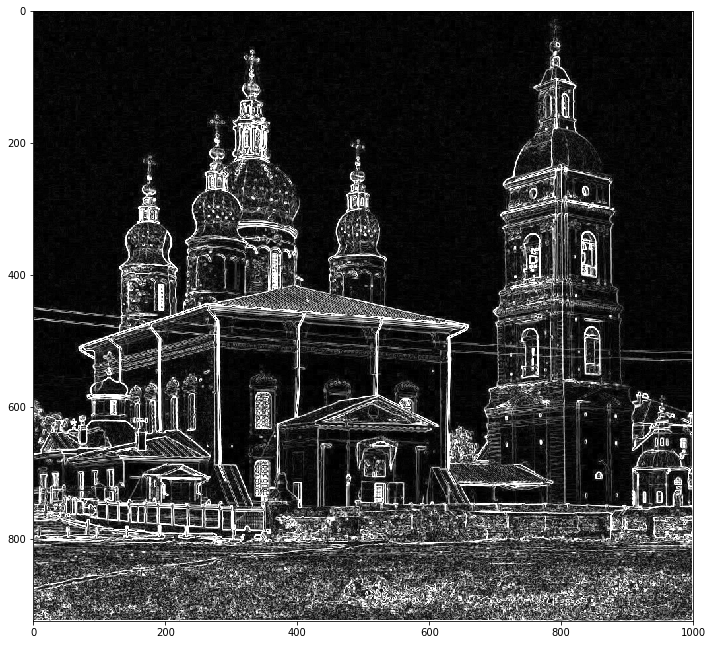

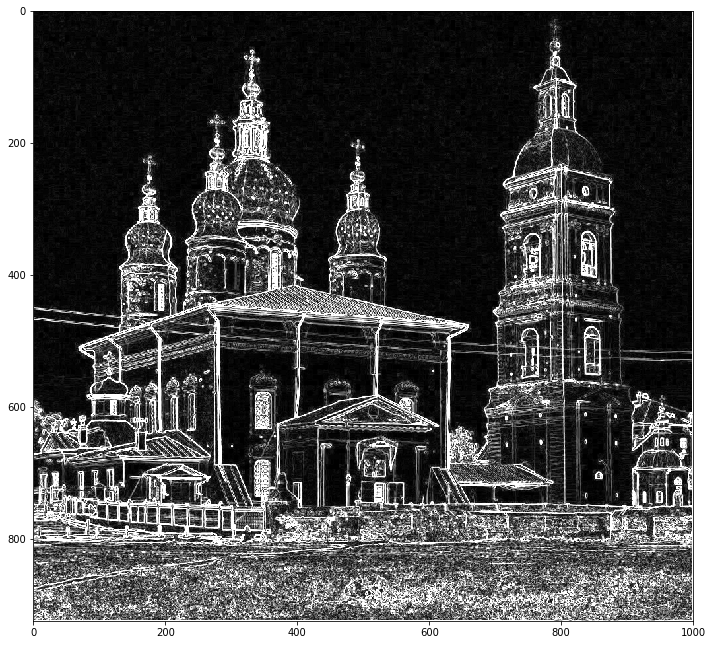

In [30]:
disp_mult(orig2, roberts2[0], previtt2[0], sobel2[0])